# Hydrodynamical code 

### To do:
* I want to try using upwind/downwind and compare the result with Lax
* There are parameters in the evolve functions that I no longer use. Remove these
* Compare solutions using the hyperbolic function and different number of points. 
* Make the evolve function work for 2D and 3D cases.
____________

### Questions/problems: 
* The dt seems to be too large, causing instabilites.
    * This is fixed by using cfl_cut = 0.48
    * I have not tried to do a von Neumann analysis yet.
* Riemann solver does not work very well anymore. I will come back to this after expanding my evolve function to 2-3 dimensions. 



____________
### What I have tried so far: 
* Approximated the initial conditions for the pressure and the density using a hyperbolic function
    * Does not seem to need the hyperbolic function, but I keep it there for future models.
* Make the Lax method more diffusive 
    * This does not seem to be necessary as well, but good for comparison.
* Set the boundaries in the evolve functions to be the right step for the leftmost boundary and the left step for the rightmost boundary 
    * I think this makes sense, compared to using `wrap`
* Used $u+u_{\text sound}$ as the $v_a$ in the Riemann solver
* Fixed the equation of state. 
* Fixed the total energy. 
    * This was my main error
* Using cfl_cut = 0.48 to make the solution stable
    * If I use 0.98, the solution becomes a lot more unstable, and the time steps are varying a lot more as well. 
* I use $\gamma$ in the sound speed.
    * Seems like this is what the tests are using as well. 
* I have set u2 = u3 in the analytical solution




_____________


In [51]:
import numpy as np 
import matplotlib.pyplot as plt 
from nm_lib import nm_lib as nm
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

### R.h.s of Euler's equations and making step functions

I rewrite the equations with the assumption of 1 dimension

We want to solve the hydrodynamic equations:

$$\tag{1}
\frac{\partial \rho}{\partial t} + \nabla \cdot (\rho \bf u) = 0 
$$

$$\tag{2}
\frac{\partial \rho {\bf u}}{\partial t} + \nabla \cdot (\rho {\bf u} \otimes {\bf u}) = - \nabla (P_g)
$$

$$\tag{3}
\frac{\partial e}{\partial t } = -\nabla\cdot e {\bf u} -P_g \nabla \cdot {\bf u}
$$



We start by doing this in one dimension, 1D, similarly to what we have done so far with the other differential equations in the exercises. 


Let us start with the **continuity equation** in eq.(1). In 1D, this can be written as 

$$
\frac{\partial \rho}{\partial t} + \frac{\partial \rho u}{\partial x},
$$

giving us the right-hand-side: 

$$
\frac{\partial \rho}{\partial t} =-  \frac{\partial \rho u}{\partial x}.
$$

With the r.h.s having only one term, I write the Flux as: $F_{\rho} = \rho u$.



The step function below returns the r.h.s of the continuity equation.

In [52]:
def step_cont_1D(xx, rho, u, axis, cfl_cut = 0.98, 
                    ddx = lambda x,y: nm.deriv_cent(x, y), bnd_limits=[1,1]): 
   
    rhs = -ddx(xx,rho*u,axis=axis) 
    return rhs

The momentum equation, eq.2, can in 1D be rewritten as

$$
\frac{\partial \rho u}{\partial t} = - \frac{\partial \rho u^2}{\partial x} - \frac{\partial Pg}{\partial x}.
$$

Here, I write the flux as $F_{\text mom} = \rho u^2 + P_g$. 


In 1D, the energy equation can be written as:

$$
\frac{\partial e}{\partial t} = -\frac{\partial e u}{\partial x} - P_g\frac{\partial u}{\partial x},
$$

with the flux being $F_{e} = u(e+P_g)$. 

The step functions returning the r.h.s of the momentum and energy equations are implemented below. 


In [53]:
def step_mom_1D(xx, rho, u, Pg, cfl_cut = 0.98, 
                    ddx1 = lambda x,y: nm.deriv_cent(x, y), ddx2 = lambda x,y: nm.deriv_cent(x, y), bnd_limits=[1,1]): 

    # rhs = -ddx1(xx,rho*u**2) - ddx2(xx, Pg)
    rhs = -ddx1(xx, rho*u**2 + Pg)

    return rhs

In [54]:
def step_e_1D(xx, e, u, Pg, cfl_cut = 0.98, 
                    ddx1 = lambda x,y: nm.deriv_cent(x, y), ddx2 = lambda x,y: nm.deriv_cent(x, y), bnd_limits=[1,1]): 

    # rhs = -ddx1(xx,e*u) - Pg*ddx2(xx, u)
    rhs = -ddx1(xx, u*(e+Pg))

    return rhs

### Initial conditions 

To compare to the analytical solutions (not implemented in the code yet) I used the initial conditions from: https://en.wikipedia.org/wiki/Sod_shock_tube
This way I could compare my plot to the plot in Wikipedia.
I will change back to the initial conditions from the project description.

In [55]:
# gamma = 5/3
gamma = 1.4
x = np.linspace(0,1,1024)

idx = int(len(x)/2)
print(idx)

# rho_L = 0.125
# rho_R = 1
# Pg_L = 0.125/gamma
# Pg_R = 1/gamma

rho_L = 1
rho_R = 0.125
Pg_L = 1
Pg_R = 0.1

rho_0 = np.zeros((len(x), 1, 1))
Pg_0 = np.zeros((len(x), 1, 1))

rho_0[:idx,0,0] = rho_L
rho_0[idx:,0,0] = rho_R

Pg_0[:idx,0,0] = Pg_L
Pg_0[idx:,0,0] = Pg_R


512


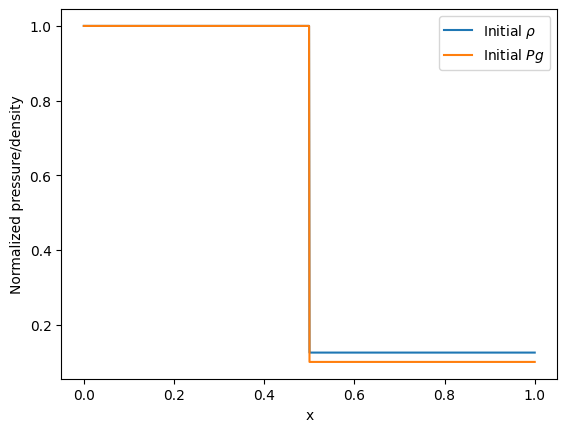

In [56]:
plt.plot(x,rho_0[:,0,0], label=r"Initial $\rho$")
plt.plot(x,Pg_0[:,0,0], label=r"Initial $Pg$")
plt.xlabel("x")
plt.ylabel("Normalized pressure/density")
plt.legend()
plt.show()

### Implement hyperbolic curve fitting

In order to make the initial conditions more continuous, I fit them using a hyperbolic function; $\tanh$. 

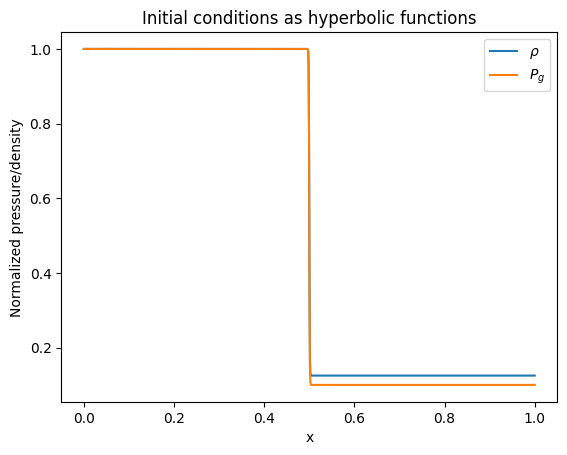

In [57]:
def f(xx, a, b,c,d): 
    return a*np.tanh(c+b*xx) + d

new_ic_rho = np.zeros((len(x), 1, 1))
new_ic_Pg = np.zeros((len(x), 1, 1))

new_ic_rho[:,0,0] = f(x, (rho_R-rho_L)/2, 1000,-500, (rho_R+rho_L)/2)
new_ic_Pg[:,0,0]= f(x, (Pg_R-Pg_L)/2, 1000, -500, (Pg_R+Pg_L)/2)



plt.plot(x,new_ic_rho[:,0,0], label=r"$\rho$")
plt.plot(x, new_ic_Pg[:,0,0], label=r"$P_g$")
plt.title("Initial conditions as hyperbolic functions")
plt.xlabel("x")
plt.ylabel("Normalized pressure/density")
plt.legend()
plt.show()


In [58]:
plt.close()

The initial velocity $u$ is zero. Using the equation of state, 

$$
e = \frac{P_g}{(\gamma -1)\rho},
$$
we can compute the initial energy.
I have here used the equation of state to compute the internal energy. In the function below I consider the total energy: 
$$
E_{tot} = \frac{1}{2}\rho u_0^2 + \frac{P_g}{(\gamma -1)\rho},
$$
where $\frac{1}{2}\rho u_0^2$ is the kinetic energy. Since the initial velocity is zero, the initial energy will be equal to the internal energy from the equation of state. 

In [59]:
# def e(rho,Pg, gamma): 
#     return Pg/(rho*(gamma-1)) 

def e(rho, u0,Pg, gamma): 
    return 0.5*rho*u0**2 + Pg/((gamma-1)) 

In [60]:
nt = 1000


u = np.zeros((len(x),1,1))
# e0 = new_ic_Pg/(new_ic_rho*(gamma-1))
# e0 = e(new_ic_rho, new_ic_Pg, gamma)
e0 = e(rho_0, u, Pg_0, gamma)

Now comes the evolve function. This one is without trying to use Riemann solvers, only the Lax method. As for now it used the more diffusive Lax method, but the less diffusive method we used in some exercises is commented out right above. 

My main goal with this evolve function is to evolve the three equations in time all at once, since they depend on each other. Here I also evolve the time using a computed time step, based on a comparison between $u$ and $u_{\text sound}$.

The pressure is updated using the extra energy-pressure relation: $P_g = (\gamma -1)e \rho$, with $\gamma = 5/3$. The velocity $u$ is found by assuming $u = \text{momentum}/\rho$. 

In [61]:
def evolv_Euler(xx, rho, u, energy, Pg, nt, gamma, cfl_cut = 0.98, 
        ddx = lambda x,y: nm.deriv_cent(x, y),
        bnd_type='wrap', bnd_limits=[1,0], axis = 0, **kwargs):
    
    # gamma = gamma

    t = np.zeros(nt)
    # un = np.zeros((len(xx), nt))
    # un[:,0] = hh
    # d = len(un)

    rho_new = np.zeros((len(xx), 1, 1, nt))
    mom_new = np.zeros((len(xx), 1, 1, nt))
    e_new = np.zeros((len(xx), 1, 1, nt)) 

    rho_new[:,:,:,0] = rho
    mom_new[:,:,:,0] = rho*u
    e_new[:,:,:,0] = energy

    d = len(rho_new)
    dx = xx[1]-xx[0]

    for i in range(nt-1): 
        rhs_cont = step_cont_1D(xx, rho_new[:,:,:,i], u, axis = axis, cfl_cut = cfl_cut ,ddx = ddx)
        rhs_mom = step_mom_1D(xx, rho_new[:,:,:,i], u, Pg, cfl_cut=cfl_cut, ddx1 = ddx, ddx2=ddx)
        rhs_e = step_e_1D(xx, e_new[:,:,:,i], u, Pg, cfl_cut=cfl_cut, ddx1=ddx, ddx2=ddx)

        #Finding smallest time step
        dt1 = np.min(np.abs(dx/u))

        u_sound = np.sqrt(gamma*Pg/rho_new[:,:,:,i])
        u = u + u_sound
        # print(u_sound[450:550,0,0])
        # u_sound = np.sqrt(Pg/rho_new[:,:,:,i])

        dt2 = np.min(np.abs(dx/u_sound))

        u_tot = u_sound 

        dt = cfl_cut*min(dt1,dt2)
        # dt = 0.0004
        # print(dt)

        # dt = 0.0002

        #Using Lax method to evolve the three parameters    
        # Old lax method
        rho_new[:,:,:, i+1] = 0.5*(np.roll(rho_new[:,:,:,i], -1) + np.roll(rho_new[:,:,:,i], 1)) + rhs_cont*dt
        mom_new[:,:,:, i+1] = 0.5*(np.roll(mom_new[:,:,:,i], -1) + np.roll(mom_new[:,:,:,i], 1)) + rhs_mom*dt
        e_new[:,:,:, i+1] = 0.5*(np.roll(e_new[:,:,:,i], -1) + np.roll(e_new[:,:,:,i], 1)) + rhs_e*dt

        # print(rho_new[450:550,0,0,i])


        # More diffusive Lax method:
        # rho_new[:,:,:, i+1] = (1/3)*(np.roll(rho_new[:,:,:,i], -1) + rho_new[:,:,:,i] + np.roll(rho_new[:,:,:,i], 1)) + rhs_cont*dt
        # mom_new[:,:,:, i+1] = (1/3)*(np.roll(mom_new[:,:,:,i], -1) + mom_new[:,:,:,i] + np.roll(mom_new[:,:,:,i], 1)) + rhs_mom*dt
        # e_new[:,:,:, i+1] = (1/3)*(np.roll(e_new[:,:,:,i], -1) + e_new[:,:,:,i] + np.roll(e_new[:,:,:,i], 1)) + rhs_e*dt

        t[i+1] = t[i]+dt

        
        # Boundaries: 
        rho_new[0,0,0,i+1] = rho_new[1,0,0,i+1]
        rho_new[-1,0,0,i+1] = rho_new[-2,0,0,i+1]

        mom_new[0,0,0,i+1] = mom_new[1,0,0,i+1]
        mom_new[-1,0,0,i+1] = mom_new[-2,0,0,i+1]

        e_new[0,0,0,i+1] = e_new[1,0,0,i+1]
        e_new[-1,0,0,i+1] = e_new[-2,0,0,i+1]

        u = mom_new[:,:,:,i+1]/rho_new[:,:,:,i+1]  # + u_sound
        # Pg = (gamma-1)*e_new[:,:,:,i+1]*rho_new[:,:,:,i+1]
        Pg = (e_new[:,:,:,i+1] - 0.5*rho_new[:,:,:,i+1]*u**2)*(gamma -1)

    return t, rho_new, mom_new, e_new 

In [62]:
# t, rho_new, mom_new, e_new = evolv_Euler(x, new_ic_rho, u, e0, new_ic_Pg, nt, gamma, cfl_cut = 0.48, 
#         ddx = nm.deriv_cent,
#         bnd_type='wrap', bnd_limits=[0,0], axis=0)

t, rho_new, mom_new, e_new = evolv_Euler(x, rho_0, u, e0, Pg_0, nt, gamma, cfl_cut = 0.48, 
        ddx = nm.deriv_cent,
        bnd_type='wrap', bnd_limits=[0,0], axis=0)


C:\Users\eier\AppData\Local\Temp\ipykernel_27404\776174599.py:29: RuntimeWarning: divide by zero encountered in divide
  dt1 = np.min(np.abs(dx/u))


In [63]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,rho_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,rho_new[:,:,:,::M][:,0,0,i])
    axes.set_title('Density, t=%.12f'%t[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

In [64]:
plt.close()

In [65]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,mom_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,mom_new[:,:,:,::M][:,0,0,i])
    axes.set_title('Momentum, t=%.6f'%t[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

In [66]:
plt.close()

In [67]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,e_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,e_new[:,:,:,::M][:,0,0,i])
    axes.set_title('Energy, t=%.6f'%t[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

In [68]:
plt.close()

### Analytical solution

Solving the analytical solutions using iterative function `fsolve`. This for the pressure ratio $P3/P4$. 
I have yet to write up the analytical expressions I have combined to make the analytical function. They are more or less presented in the same Wikipedia page as linked above. 

In [69]:
def ratio(P34):

    
    gamma = 1.4 
    Pg_L = 1
    Pg_R = 0.1
    rho_L = 1
    rho_R = 0.125

    # gamma = 5/3
    # rho_L = 0.125
    # rho_R = 1
    # Pg_L = 0.125/gamma
    # Pg_R = 1/gamma


    c1 = np.sqrt(gamma*Pg_L/rho_L)
    c4 = np.sqrt(gamma*Pg_R/rho_R)
    u1 = 0
    u4 = 0

    term1 = (u1 - u4)*(gamma-1)/(2*c1)
    term2 = (gamma-1)*(c4/c1)*(P34 -1)/np.sqrt(2*gamma*((gamma-1) + (gamma+1)*P34))

    par = (1 + term1 - term2)**(2*gamma/(gamma-1))
    r = par/P34 - (Pg_R/Pg_L)
    return r


In [70]:
from scipy.optimize import fsolve 

P34 = fsolve(ratio, 5)[0]

print(P34)

# Checking whether or not the root could be correct
print(np.isclose(ratio(P34), 0))


3.031301780506469
True


In [71]:
t_end = 0.2

# gamma = 5/3
# rho_L = 0.125
# rho_R = 1
# Pg_L = 0.125/gamma
# Pg_R = 1/gamma

gamma = 1.4 
Pg_L = 1
Pg_R = 0.1
rho_L = 1
rho_R = 0.125

c1 = np.sqrt(gamma*Pg_L/rho_L)
c4 = np.sqrt(gamma*Pg_R/rho_R)
u1 = 0
u4 = 0

In [72]:
Pg_3 = P34*Pg_R
rho_34 = (((gamma+1)/(gamma-1)) + P34)/(1 + ((gamma+1)/(gamma-1)))
# rho_3 = (rho_34)*rho_R
# rho_3 = rho_R*(1 + (gamma+1)/(gamma-1)*P34)/((gamma+1)/(gamma-1) + P34)
rho_3 = rho_R*((Pg_3 + (gamma-1)/(gamma+1)*Pg_R)/(Pg_R + (gamma-1)/(gamma+1)*Pg_3))
# print(rho_3)

Pg_2 = Pg_3

up = u4 + c4/gamma*P34*((2*gamma/(gamma+1))/(P34 + ((gamma-1)/(gamma+1))))**0.5
u3 = up
# u2 = up
u2 = u1 + 2*c1/(gamma-1)*(1 - (Pg_2/Pg_L)**((gamma-1)/(2*gamma)))

print(up)
print(u2)

rho_2 = rho_L*(Pg_2/Pg_L)**(1/gamma)

c3 = np.sqrt(gamma*Pg_3/rho_3)
c2 = np.sqrt(gamma*Pg_2/rho_2)

1.3840330400285485
0.9274526200489498


In [73]:
def analytical(x,tt):
    
    pos1 = 0.5 + (u1 - c1)*tt

    pos2 = 0.5 + (u2 + u4 - c2)*tt
    
    pos3 = 0.5 + (u2+u4)*tt
    pos4 = 0.5 + tt*(c4*np.sqrt((gamma-1)/(2*gamma) + (gamma+1)/(2*gamma)*P34) + u4)

    L = len(x)
    
    x_rare = np.linspace(pos1, pos2, len(x[int(pos1*L):int(pos2*L)]))
    
    u_rare = 2/(gamma+1)*(c1 + (x_rare - 0.5)/tt)
    rho_rare = rho_L*(1 - ((gamma-1)/2 *u_rare/c1))**(2/(gamma-1))
    Pg_rare = Pg_L*(1- (gamma-1)/2 *u_rare/c1)**(2/(gamma-1))

    a_rho = np.zeros(L)
    a_mom = np.zeros(L)
    a_e = np.zeros(L)

    a_mom[:int(L*pos1)] = u1*rho_L
    a_mom[int(L*pos1):int(pos2*L)] = u_rare*rho_rare
    a_mom[int(pos2*L):int(pos3*L)] = u2*rho_2
    a_mom[int(pos3*L):int(pos4*L)] = u2*rho_3
    a_mom[int(pos4*L):] = u4*rho_R

    a_rho[:int(L*pos1)] = rho_L
    a_rho[int(L*pos1):int(pos2*L)] = rho_rare
    a_rho[int(pos2*L):int(pos3*L)] = rho_2
    a_rho[int(pos3*L):int(pos4*L)] = rho_3
    a_rho[int(pos4*L):] = rho_R


    a_e[:int(L*pos1)] = 0.5*rho_L*u1**2 + Pg_L/(gamma-1)
    a_e[int(L*pos1):int(pos2*L)] = 0.5*rho_rare*u_rare**2 + Pg_rare/(gamma-1)
    a_e[int(pos2*L):int(pos3*L)] = 0.5*rho_2*u2**2 + Pg_2/(gamma-1)
    a_e[int(pos3*L):int(pos4*L)] = 0.5*rho_3*u2**2 + Pg_3/(gamma-1)
    a_e[int(pos4*L):] = 0.5*rho_R*u4**2 + Pg_R/(gamma-1)



    return a_rho, a_mom, a_e


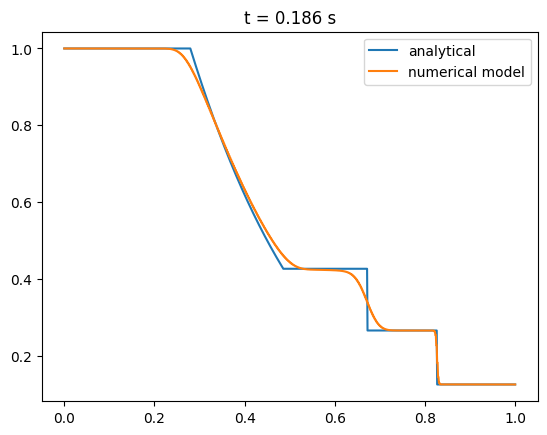

In [74]:
a_rho = np.zeros((len(x), len(t)))
a_mom = np.zeros((len(x), len(t)))
a_e = np.zeros((len(x), len(t)))

for i in range(len(t)): 
    a_rho[:,i], a_mom[:,i], a_e[:,i] = analytical(x,t[i])



plt.plot(x, a_rho[:,500], label="analytical")
# plt.plot(x, mom_new[:,0,0,500])
plt.plot(x, rho_new[:,0,0,500], label="numerical model")
plt.title(f"t = {t[500]:.3f} s")
plt.legend()
# plt.plot(x, e_new[:,0,0,500])
plt.show()


In [75]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,rho_new[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,rho_new[:,:,:,::M][:,0,0,i], label="numerical model")
    axes.plot(x, a_rho[:,M*i], label="analytical")
    axes.set_title('Density, t=%.12f'%t[::M][i])
    axes.legend()
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t[::M]), init_func=init)
HTML(anim.to_jshtml())

### Bifrost 6th order spatial derivative ?


### Implementing Riemann solver in 1D case
This model is not working, but I have kept my ideas here, so I can come back to them later.



In [76]:
def evolv_Rie_Euler(xx, rho, u, energy, Pg, nt, gamma, cfl_cut = 0.98,
        bnd_type='wrap', bnd_limits=[1,1], axis = 0, **kwargs):

    t = np.zeros(nt)

    rho_new = np.zeros((len(xx), 1, 1, nt))
    mom_new = np.zeros((len(xx), 1, 1, nt))
    e_new = np.zeros((len(xx), 1, 1, nt)) 

    rho_new[:,:,:,0] = rho
    mom_new[:,:,:,0] = rho*u
    e_new[:,:,:,0] = energy

    d = len(rho_new)
    dx = xx[1]-xx[0]

    
    for i in range(nt-1): 
    # for i in range(100):

        # Computing left and right
        rho_L = rho_new[:,:,:,i]
        rho_R = np.roll(rho_new[:,:,:,i],-1)

        # print(rho_new[450:550,0,0,i][50])

        mom_L = mom_new[:,:,:,i]
        mom_R = np.roll(mom_new[:,:,:,i],-1)

        e_L = e_new[:,:,:,i]
        e_R = np.roll(e_new[:,:,:,i],-1)

        # Defining the flux
        F_rho_L = rho_L*u
        F_rho_R = rho_R*u

        # print(F_rho_L[:,0,0])

        F_mom_L = (rho_L*u**2 + Pg)
        F_mom_R = (rho_R*u**2 + Pg)

        F_e_L = u*(e_L + Pg)
        F_e_R = u*(e_R + Pg)



        # Computing the dt, and choosing the smallest one??
        dt1 = cfl_cut*np.min(np.abs(dx/u))
        
        u_sound = np.sqrt(gamma*Pg/rho_new[:,:,:,i])
        print(u_sound[450:550,0,0])

        dt2 = cfl_cut*np.min(np.abs(dx/u_sound))


        # dt = cfl_cut*min(dt1,dt2)

        # va_rho = np.zeros(np.shape(rho_new[:,:,:,0]))
        # for j in range(len(va_rho)): 
        #     va_rho[j,:,:] = np.max(np.array([np.abs(rho_R[j]), np.abs(rho_L[j])]))

        # va_mom = np.zeros(np.shape(mom_new[:,:,:,0]))
        # for j in range(len(va_mom)): 
        #     va_mom[j,:,:] = np.max(np.array([np.abs(mom_R[j]), np.abs(mom_L[j])]))

        # va_e = np.zeros(np.shape(e_new[:,:,:,0]))
        # for j in range(len(va_e)): 
        #     va_e[j,:,:] = np.max(np.array([np.abs(e_R[j]), np.abs(e_L[j])]))

        va_rho = np.abs(u)+u_sound
        va_mom = np.abs(u)+u_sound
        va_e = np.abs(u)+u_sound


        # dt3_rho = cfl_cut*np.min(dx/np.abs(va_rho)) 
        # dt3_mom = cfl_cut*np.min(dx/np.abs(va_mom))
        # dt3_e = cfl_cut*np.min(dx/np.abs(va_e))


        # dt = cfl_cut*np.min(np.abs(dx/va_e))
        
        # dt = min(dt1, dt2, dt3_e)

        # print(dt)
        
        dt = 0.0004

        # Computing the r.h.s
        # rhs_rho = ((F_rho_R + F_rho_L)/2 - u/2*(rho_R - rho_L))/dx
        # rhs_mom = ((F_mom_R + F_mom_L)/2 - u/2*(mom_R - mom_L))/dx
        # rhs_e = ((F_e_R + F_e_L)/2 - u/2*(e_R - e_L))/dx

        # print(rhs_rho.shape)

        rhs_rho = ((F_rho_R + F_rho_L)/2 - va_rho/2*(rho_R - rho_L))/dx
        rhs_mom = ((F_mom_R + F_mom_L)/2 - va_mom/2*(mom_R - mom_L))/dx
        rhs_e = ((F_e_R + F_e_L)/2 - va_e/2*(e_R - e_L))/dx    

        # print(rhs_rho[:,0,0])

        # Evloving the parameters in time
        rho_new[:,:,:,i+1] = rho_new[:,:,:,i] - dt*(rhs_rho - np.roll(rhs_rho,1))
        mom_new[:,:,:,i+1] = mom_new[:,:,:,i] - dt*(rhs_mom - np.roll(rhs_mom,1))
        e_new[:,:,:,i+1] = e_new[:,:,:,i] - dt*(rhs_e - np.roll(rhs_e,1))


        # rho_new[:,:,:,i+1] = np.pad(rho_new[bnd_limits[0]:d- bnd_limits[1],:,:,i+1], bnd_limits, bnd_type)
        
        # if axis==0:
        #     rho_new[:,0,0,i+1] = np.pad(rho_new[bnd_limits[0]:d- bnd_limits[1],0,0,i+1], bnd_limits, bnd_type)
        #     mom_new[:,0,0,i+1] = np.pad(mom_new[bnd_limits[0]:d- bnd_limits[1],0,0,i+1], bnd_limits, bnd_type)
        #     e_new[:,0,0,i+1] = np.pad(e_new[bnd_limits[0]:d- bnd_limits[1],0,0,i+1], bnd_limits, bnd_type)

        if axis ==0:
            rho_new[0,0,0,i+1] = rho_new[1,0,0,i+1]
            rho_new[-1,0,0,i+1] = rho_new[-2,0,0,i+1]

            mom_new[0,0,0,i+1] = mom_new[1,0,0,i+1]
            mom_new[-1,0,0,i+1] = mom_new[-2,0,0,i+1]

            e_new[0,0,0,i+1] = e_new[1,0,0,i+1]
            e_new[-1,0,0,i+1] = e_new[-2,0,0,i+1]


        # Updating the time
        t[i+1] = t[i]+dt

        # Updating the velocity and the pressure
        u = mom_new[:,:,:,i+1]/rho_new[:,:,:,i+1]
        Pg = (e_new[:,:,:,i+1] - 0.5*rho_new[:,:,:,i+1]*u**2)*(gamma -1)


    return t, rho_new, mom_new, e_new

    

In [77]:
t_R, rho_new_R, mom_new_R, e_new_R = evolv_Rie_Euler(x, new_ic_rho, u, e0, new_ic_Pg, nt, gamma, cfl_cut = 0.48,
        bnd_type='wrap', bnd_limits=[1,1], axis=0)

C:\Users\eier\AppData\Local\Temp\ipykernel_27404\3513857046.py:48: RuntimeWarning: divide by zero encountered in divide
  dt1 = cfl_cut*np.min(np.abs(dx/u))
C:\Users\eier\AppData\Local\Temp\ipykernel_27404\3513857046.py:50: RuntimeWarning: invalid value encountered in sqrt
  u_sound = np.sqrt(gamma*Pg/rho_new[:,:,:,i])


[1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596 1.18321596
 1.18321595 1.18321591 1.18321564 1.18321372 1.18320017 1.18310454
 1.18243317 1.1778892  1.15333158 1.09711378 1.06579923 1.0594199
 1.05846021 1.05832316 1.05830373 1.05830098 1.05830059 1.05830053
 1.05830053 1.05830052 1.05830052 1.05830052 1.05830052 1.05830052
 1.05830052 1.05830052 1.05830052 1.05830052 1.05830052 1.05830052
 1.05830052 1.05830052 1.05830052 1.05830052 1.05830052 1.05830

C:\Users\eier\AppData\Local\Temp\ipykernel_27404\3513857046.py:97: RuntimeWarning: overflow encountered in divide
  rhs_e = ((F_e_R + F_e_L)/2 - va_e/2*(e_R - e_L))/dx
C:\Users\eier\AppData\Local\Temp\ipykernel_27404\3513857046.py:129: RuntimeWarning: invalid value encountered in divide
  u = mom_new[:,:,:,i+1]/rho_new[:,:,:,i+1]


[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan]
[nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan nan
 nan nan nan nan nan nan nan nan nan nan

In [78]:
plt.ioff()

M = 10

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 5))

def init(): 
    axes.plot(x,rho_new_R[:,0,0,0])

def animate(i):
 
    axes.clear()
    axes.plot(x,rho_new_R[:,:,:,::M][:,0,0,i])
    axes.set_title('Density, t=%.11f'%t_R[::M][i])
    axes.set_xlabel("x")
    axes.set_ylabel("u_i")
    axes.grid()
    
    
anim = FuncAnimation(fig, animate, interval=50, frames=len(t_R[::M]), init_func=init)
HTML(anim.to_jshtml())